<h1>Custom instance model training using YOLOv8</h1>
<p>
This code walks you through the process of training a custom YOLO v8 model using your own data. 

If you already have annotations in COCO format JSON file, for example by annotating using makesense (https://www.makesense.ai/) then the annotations can be imported to Roboflow for conversion to YOLO format. Otherwise, if you are starting from scratch, just annotate datasets on Roboflow. (https://roboflow.com/). You just need to upload your images along with the JSON file and Roboflow will convert them to any other format, in our case YOLO v8. <p>

For information about YOLO models: <p>
https://docs.ultralytics.com/models/yolov8/#key-features
<p>


<h3>Imports</h3>

Let us start by installing ultralytics library. All other libraries should be pre-installed on colab. If you are working on a local system, please make sure you install matplotlib, Pillow, numpy, Seaborn, and roboflow. You may also want to install pandas and other libraries depending on the task.

In [3]:
from ultralytics import YOLO
from matplotlib import pyplot as plt
from PIL import Image

**Import a model and populate it with pre-trained weights.**
<p>
Here, we are importing an instance segmentation model with weights. For a list of pre-trained models, checkout: https://docs.ultralytics.com/models/yolov8/#key-features

In [2]:
#Instance
model = YOLO('yolov8n-seg.yaml')  # build a new model from YAML
model = YOLO('yolov8n-seg.pt')  # Transfer the weights from a pretrained model (recommended for training)


                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           


  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  8                  -1  1    460288  ultralytics.nn.modules.block.C2f             [256, 256, 1, True]           
  9                  -1  1    164608  ultralytics.nn.modules.block.SPPF            [256, 256, 5]                 
 10                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 11             [-1, 6]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 12                  -1  1    148224  ultralytics.nn.modules.block.C2f             [384, 128, 1]                 
 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 14             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 15                  -1  1     37248  ultralytics.nn.modules.block.C2f             [192,

100%|██████████| 6.73M/6.73M [00:00<00:00, 15.0MB/s]


Let us load the YAML file that contains the names of our classes, number of classes and the directories for train, valid, and test datasets, respectively.

In [3]:
# This is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
yaml_file = "./datasets/yolo_dataset/data.yaml"

In [4]:
# define number of classes based on YAML
import yaml
with open(yaml_file, 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

**Train the model**

In [5]:
# Define a project --> Destination directory for all results
project = "./YOLOV8-data/results"
# Define subdirectory for this specific training
name = "200_epochs_GPU-" # Note that if you run the training again, it creates a directory: 200_epochs-2

In [6]:
# Train the model
results = model.train(data=yaml_file,
                      project=project,
                      name=name,
                      epochs=200,
                      patience=0, # I am setting patience=0 to disable early stopping.
                      batch=4,
                      imgsz=800)

Ultralytics YOLOv8.1.2 🚀 Python-3.9.18 torch-2.1.2 CUDA:0 (NVIDIA GeForce RTX 3070, 8192MiB)
engine\trainer: task=segment, mode=train, model=yolov8n-seg.pt, data=./datasets/yolo_dataset/data.yaml, epochs=200, time=None, patience=0, batch=4, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=./YOLOV8-data/results, name=200_epochs_GPU-, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=Fal

100%|██████████| 6.23M/6.23M [00:00<00:00, 14.5MB/s]


AMP: checks passed ✅


train: Scanning C:\Users\alber.DESKTOP-VIFBJNG\PythonProjects\bf_intorg_YOLOv8_dev\datasets\datasets\yolo_dataset\train\labels.cache... 95 images, 0 backgrounds, 0 corrupt: 100%|██████████| 95/95 [00:00<?, ?it/s]
val: Scanning C:\Users\alber.DESKTOP-VIFBJNG\PythonProjects\bf_intorg_YOLOv8_dev\datasets\datasets\yolo_dataset\valid\labels.cache... 24 images, 0 backgrounds, 0 corrupt: 100%|██████████| 24/24 [00:00<?, ?it/s]


Plotting labels to YOLOV8-data\results\200_epochs_GPU-\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
200 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/200      10.4G      1.588      3.559      3.963        1.1       1309        800: 100%|██████████| 24/24 [02:12<00:00,  5.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:19<00:00,  6.63s/it]

                   all         24       5792     0.0783       0.11      0.068     0.0299     0.0801      0.112     0.0669     0.0311



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/200      13.2G      1.429      2.854      3.212     0.9488       1078        800: 100%|██████████| 24/24 [00:54<00:00,  2.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.23s/it]

                   all         24       5792      0.143      0.181      0.119      0.051      0.131      0.169      0.106     0.0508



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/200      10.9G      1.481      2.823      2.733     0.9426       1390        800: 100%|██████████| 24/24 [00:48<00:00,  2.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.26s/it]

                   all         24       5792       0.27      0.358      0.262      0.135      0.229      0.305      0.225      0.105



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/200      10.5G      1.542      2.829       2.41     0.9357        867        800: 100%|██████████| 24/24 [00:50<00:00,  2.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.69s/it]

                   all         24       5792      0.374      0.413      0.334      0.184      0.326      0.344      0.276      0.132



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/200      9.86G      1.495      2.581      2.244     0.9332       1492        800: 100%|██████████| 24/24 [00:29<00:00,  1.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.10s/it]

                   all         24       5792      0.387      0.512      0.401      0.259      0.337      0.442      0.337      0.206



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/200      10.2G       1.65       2.67      2.033     0.9393       1677        800: 100%|██████████| 24/24 [01:02<00:00,  2.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.09s/it]

                   all         24       5792      0.404      0.523      0.415      0.282      0.381      0.406      0.341      0.196



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/200      7.36G      1.632      2.587      1.933     0.9328       1400        800: 100%|██████████| 24/24 [00:31<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.05s/it]

                   all         24       5792      0.472      0.542      0.453      0.287       0.42      0.467      0.381      0.209



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/200      11.3G      1.498      2.526      1.783     0.9239        622        800: 100%|██████████| 24/24 [00:51<00:00,  2.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.80s/it]

                   all         24       5792      0.503      0.557      0.478      0.301      0.457      0.491      0.416      0.255



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/200      11.6G       1.48      2.482      1.674     0.9126        977        800: 100%|██████████| 24/24 [00:40<00:00,  1.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.54it/s]

                   all         24       5792      0.565      0.565      0.533      0.364      0.491      0.476      0.432       0.24



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/200      9.88G        1.4      2.456      1.624     0.9138       1596        800: 100%|██████████| 24/24 [00:35<00:00,  1.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.37s/it]

                   all         24       5792      0.573      0.588      0.543      0.353      0.505      0.493      0.444      0.249



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/200       8.3G      1.458       2.41      1.565     0.9184       1405        800: 100%|██████████| 24/24 [00:59<00:00,  2.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [05:09<00:00, 103.20s/it]

                   all         24       5792       0.59       0.59      0.568      0.392      0.519      0.505      0.469      0.257



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/200      10.7G      1.357      2.324      1.473     0.9088        676        800: 100%|██████████| 24/24 [00:41<00:00,  1.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.44s/it]

                   all         24       5792      0.591      0.608      0.583      0.407      0.522      0.518      0.484      0.278



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/200      9.01G      1.302      2.377      1.413     0.8993       1162        800: 100%|██████████| 24/24 [00:27<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]

                   all         24       5792      0.621       0.61      0.605      0.426      0.546      0.511      0.489      0.276



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/200      8.74G      1.347      2.341      1.376     0.9059        722        800: 100%|██████████| 24/24 [00:39<00:00,  1.63s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.63it/s]

                   all         24       5792      0.634      0.612      0.606      0.416      0.569       0.52      0.503      0.272



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/200      8.82G      1.285      2.241      1.342     0.9039       1686        800: 100%|██████████| 24/24 [00:24<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.63it/s]

                   all         24       5792      0.632       0.62      0.626      0.432       0.56      0.512       0.51      0.287



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/200      13.4G      1.226      2.355       1.34     0.9044       1074        800: 100%|██████████| 24/24 [00:58<00:00,  2.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.83s/it]

                   all         24       5792      0.638      0.612      0.627      0.446      0.558      0.502      0.504       0.29



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/200      7.23G      1.214      2.214      1.258      0.897       1228        800: 100%|██████████| 24/24 [00:25<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.89it/s]

                   all         24       5792      0.643      0.633      0.637      0.456      0.571      0.526      0.522      0.296



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     18/200      11.4G      1.159      2.326      1.237     0.8849       1120        800: 100%|██████████| 24/24 [00:50<00:00,  2.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.16s/it]

                   all         24       5792       0.64      0.624      0.632      0.459      0.569      0.526      0.524      0.307



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     19/200       6.7G       1.15      2.225      1.223     0.8986       1449        800: 100%|██████████| 24/24 [00:21<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.90it/s]

                   all         24       5792      0.626      0.639      0.637      0.453      0.549      0.526      0.524      0.312



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     20/200      7.57G      1.224      2.282      1.239     0.8996       1426        800: 100%|██████████| 24/24 [00:35<00:00,  1.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.07it/s]

                   all         24       5792      0.642      0.623      0.644      0.456      0.578      0.507      0.523      0.304



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     21/200      7.47G      1.169      2.281        1.2     0.8869        601        800: 100%|██████████| 24/24 [00:51<00:00,  2.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]

                   all         24       5792       0.66      0.624      0.655      0.466      0.597      0.519      0.537      0.294



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     22/200      13.4G      1.148      2.237      1.195     0.8953        766        800: 100%|██████████| 24/24 [00:45<00:00,  1.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.71it/s]

                   all         24       5792      0.661      0.633      0.666       0.46        0.6      0.532      0.558      0.325



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     23/200      11.3G       1.16      2.223      1.151     0.9078        796        800: 100%|██████████| 24/24 [00:40<00:00,  1.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.07s/it]

                   all         24       5792      0.629      0.624      0.658      0.478      0.559      0.499      0.539      0.307



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     24/200      10.1G      1.132      2.153      1.122     0.8884       1203        800: 100%|██████████| 24/24 [00:23<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.23s/it]

                   all         24       5792       0.63      0.622      0.665       0.48       0.56      0.504      0.543      0.302



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     25/200      9.96G      1.087      2.177      1.093     0.8839        896        800: 100%|██████████| 24/24 [00:43<00:00,  1.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.41s/it]

                   all         24       5792      0.665      0.636      0.686       0.49      0.587      0.516      0.553      0.304



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     26/200      10.9G      1.112      2.213      1.059     0.8824       1542        800: 100%|██████████| 24/24 [00:30<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.30s/it]

                   all         24       5792      0.648      0.635      0.679      0.493      0.584      0.512      0.554      0.311



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     27/200      9.19G      1.083      2.169      1.057      0.883       1508        800: 100%|██████████| 24/24 [00:37<00:00,  1.57s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.25it/s]

                   all         24       5792      0.689      0.647      0.702      0.512      0.618      0.529      0.577      0.324



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     28/200        11G      1.083      2.206      1.081      0.884       1034        800: 100%|██████████| 24/24 [00:27<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.22s/it]

                   all         24       5792      0.704      0.648       0.71      0.504      0.618      0.529      0.579      0.304



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     29/200      11.3G      1.125      2.132      1.058     0.8864       1281        800: 100%|██████████| 24/24 [01:00<00:00,  2.53s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.16s/it]

                   all         24       5792       0.69      0.633        0.7      0.512      0.622      0.523      0.578      0.318



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     30/200       6.5G      1.129      2.169      1.048     0.8819       1449        800: 100%|██████████| 24/24 [00:45<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.33it/s]

                   all         24       5792      0.717      0.653      0.723      0.534      0.642      0.554      0.606      0.358



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     31/200      13.6G      1.088      2.162      1.032     0.8823        957        800: 100%|██████████| 24/24 [00:42<00:00,  1.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.08s/it]

                   all         24       5792       0.72      0.667      0.724      0.524      0.631      0.545      0.584      0.319



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     32/200      10.9G      1.084       2.11      1.044     0.8845       1087        800: 100%|██████████| 24/24 [00:58<00:00,  2.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.63s/it]

                   all         24       5792      0.715      0.673      0.726      0.517       0.64      0.534      0.581      0.316



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     33/200      12.8G       1.07      2.051     0.9981     0.8844        805        800: 100%|██████████| 24/24 [00:40<00:00,  1.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.51s/it]

                   all         24       5792      0.726      0.667      0.731      0.544      0.659      0.561      0.606       0.36



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     34/200      8.72G      1.085      2.012     0.9942     0.8829        800        800: 100%|██████████| 24/24 [01:06<00:00,  2.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.24it/s]

                   all         24       5792      0.724      0.669      0.731      0.529       0.64      0.549      0.587      0.326



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     35/200      13.3G       1.08      2.072      1.024     0.8783       1689        800: 100%|██████████| 24/24 [00:46<00:00,  1.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.55s/it]

                   all         24       5792      0.704      0.672       0.73       0.54      0.633      0.555      0.601      0.348



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     36/200      11.4G      1.073      2.131      1.002      0.882       1249        800: 100%|██████████| 24/24 [00:43<00:00,  1.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.31s/it]

                   all         24       5792      0.717      0.674      0.735      0.537      0.632      0.558      0.604      0.345



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     37/200      10.5G      1.091      2.123      1.001     0.8813        789        800: 100%|██████████| 24/24 [00:20<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.92it/s]

                   all         24       5792      0.726      0.665      0.733      0.541      0.634      0.545      0.594      0.335



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     38/200      8.08G      1.043      2.121     0.9948     0.8777       1702        800: 100%|██████████| 24/24 [00:25<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.70it/s]

                   all         24       5792      0.711      0.677      0.738      0.553      0.658      0.546       0.61      0.352



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     39/200      9.11G       1.07      2.132      1.008     0.8772       1129        800: 100%|██████████| 24/24 [00:52<00:00,  2.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.61s/it]

                   all         24       5792      0.741      0.673      0.742      0.534      0.673      0.533      0.602      0.321



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     40/200      10.8G       1.04      2.004     0.9603     0.8684       1394        800: 100%|██████████| 24/24 [00:28<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.24s/it]

                   all         24       5792      0.735      0.659      0.727       0.53      0.622      0.536      0.574      0.317



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     41/200      11.4G      1.052      2.025     0.9608     0.8756       1056        800: 100%|██████████| 24/24 [00:46<00:00,  1.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.29s/it]

                   all         24       5792      0.738      0.664      0.737      0.546      0.645      0.544      0.593      0.351



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     42/200      10.7G      1.032      2.026     0.9688     0.8755       1027        800: 100%|██████████| 24/24 [00:53<00:00,  2.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.01s/it]

                   all         24       5792       0.75      0.673      0.745      0.553      0.652      0.552      0.601      0.336



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     43/200      8.52G      1.055      2.033      0.973     0.8742        359        800: 100%|██████████| 24/24 [00:24<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.05it/s]

                   all         24       5792      0.741      0.677      0.748      0.565      0.665      0.562      0.616      0.347



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     44/200      9.39G      1.028          2     0.9642     0.8715       1611        800: 100%|██████████| 24/24 [00:16<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.18it/s]

                   all         24       5792      0.737      0.676      0.746      0.551      0.665      0.544      0.609      0.338



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     45/200      10.3G     0.9867      1.993     0.9399     0.8659        798        800: 100%|██████████| 24/24 [00:25<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.22s/it]

                   all         24       5792      0.713      0.684      0.747      0.561       0.64      0.554      0.606      0.344



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     46/200        11G     0.9879      2.041     0.9306     0.8671       1012        800: 100%|██████████| 24/24 [00:46<00:00,  1.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.99s/it]

                   all         24       5792      0.725      0.687      0.752      0.559      0.661      0.551       0.61      0.342



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     47/200      8.97G     0.9986      2.045      0.954     0.8666        984        800: 100%|██████████| 24/24 [00:43<00:00,  1.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.03s/it]

                   all         24       5792      0.739      0.686      0.755      0.569      0.664      0.559      0.618       0.34



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     48/200        13G     0.9899      1.968     0.9406     0.8693        880        800: 100%|██████████| 24/24 [00:29<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.03s/it]

                   all         24       5792      0.747      0.667       0.75       0.57      0.674      0.543      0.618      0.352



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     49/200      10.1G      1.025      2.025     0.9234     0.8626       1093        800: 100%|██████████| 24/24 [00:54<00:00,  2.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.85s/it]

                   all         24       5792      0.732      0.679      0.744      0.544      0.626      0.545      0.589      0.317



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     50/200      12.5G      1.001      2.005     0.9292     0.8702        913        800: 100%|██████████| 24/24 [00:55<00:00,  2.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.82s/it]

                   all         24       5792      0.744      0.695      0.756      0.566       0.65       0.55      0.603      0.334



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     51/200      10.1G     0.9768      2.037     0.9273     0.8675        692        800: 100%|██████████| 24/24 [00:35<00:00,  1.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.23it/s]

                   all         24       5792      0.753      0.695      0.761      0.567      0.669      0.568      0.625      0.353



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     52/200      12.6G      0.981       2.02     0.9209     0.8713        869        800: 100%|██████████| 24/24 [00:55<00:00,  2.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.67s/it]

                   all         24       5792      0.761      0.692      0.765      0.561      0.674      0.559      0.618      0.342



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     53/200      7.84G      1.004      2.053     0.9168     0.8681       1841        800: 100%|██████████| 24/24 [00:27<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.25it/s]

                   all         24       5792      0.749      0.675      0.751      0.559      0.657       0.55      0.603       0.34



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     54/200      12.7G     0.9863      1.926     0.8986     0.8657       1390        800: 100%|██████████| 24/24 [00:22<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.21it/s]

                   all         24       5792      0.753       0.68      0.756      0.571      0.675      0.551      0.618      0.358



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     55/200      13.8G      0.991      2.036       0.91     0.8661       1237        800: 100%|██████████| 24/24 [01:02<00:00,  2.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.66s/it]

                   all         24       5792      0.746      0.682      0.753      0.562      0.661      0.564      0.619      0.335



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     56/200      11.7G     0.9592      1.935     0.8916     0.8619        951        800: 100%|██████████| 24/24 [00:49<00:00,  2.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.68s/it]

                   all         24       5792      0.774      0.673      0.765       0.57      0.686      0.554       0.62      0.337



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     57/200      12.1G     0.9834      2.008     0.8896     0.8579        747        800: 100%|██████████| 24/24 [01:09<00:00,  2.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.84s/it]

                   all         24       5792      0.711       0.67       0.74      0.551      0.658      0.531      0.591      0.323



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     58/200      12.5G     0.9652      2.002     0.9062     0.8606        568        800: 100%|██████████| 24/24 [00:52<00:00,  2.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.66s/it]

                   all         24       5792      0.726      0.689      0.756      0.575      0.683      0.544      0.614      0.344



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     59/200      11.8G     0.9973      1.953     0.8798     0.8617        925        800: 100%|██████████| 24/24 [00:41<00:00,  1.73s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.03s/it]

                   all         24       5792      0.761      0.695      0.769      0.573       0.68      0.571      0.634      0.353



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     60/200         9G     0.9847      1.943     0.8917     0.8616        603        800: 100%|██████████| 24/24 [00:27<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.04it/s]

                   all         24       5792      0.752      0.686      0.763      0.571      0.662      0.568      0.622      0.343



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     61/200        13G     0.9494      1.941     0.8944     0.8639        880        800: 100%|██████████| 24/24 [00:47<00:00,  1.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.81s/it]

                   all         24       5792      0.752      0.695      0.762      0.568      0.653      0.562      0.612      0.345



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     62/200      9.41G     0.9695      1.928     0.8863     0.8613        593        800: 100%|██████████| 24/24 [00:39<00:00,  1.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.68s/it]

                   all         24       5792      0.748      0.695      0.757      0.558      0.645       0.56      0.606      0.333



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     63/200      9.41G      1.002      1.975     0.9384     0.8739        791        800: 100%|██████████| 24/24 [00:51<00:00,  2.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.15it/s]

                   all         24       5792      0.757      0.693      0.764      0.587      0.661      0.584      0.634      0.378



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     64/200      13.1G      1.006      1.978     0.8906     0.8626       1199        800: 100%|██████████| 24/24 [00:42<00:00,  1.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.89it/s]

                   all         24       5792      0.752      0.702      0.774      0.594      0.673      0.586      0.644      0.382



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     65/200      10.8G      1.022      2.097     0.9178     0.8583       1551        800: 100%|██████████| 24/24 [00:27<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.09it/s]

                   all         24       5792      0.738      0.688      0.757      0.544      0.654      0.543      0.598       0.32



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     66/200      12.6G      1.079      1.982     0.9376     0.8656       2065        800: 100%|██████████| 24/24 [00:47<00:00,  1.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.03s/it]

                   all         24       5792      0.744       0.69      0.757      0.531       0.65      0.532      0.586      0.311



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     67/200      11.5G      1.008      1.943     0.9069     0.8622       1587        800: 100%|██████████| 24/24 [00:52<00:00,  2.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.69s/it]

                   all         24       5792      0.769      0.698      0.769      0.586      0.681      0.578       0.63       0.37



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     68/200      9.35G      1.075       2.03     0.9272      0.871       1036        800: 100%|██████████| 24/24 [00:31<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.00it/s]

                   all         24       5792      0.772        0.7      0.775      0.591      0.698      0.585      0.647       0.39



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     69/200      10.2G     0.9903      1.972     0.8776     0.8589       1630        800: 100%|██████████| 24/24 [00:45<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.66s/it]

                   all         24       5792      0.763      0.686      0.762      0.577      0.671      0.572       0.63      0.352



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     70/200      7.19G     0.9555      1.939     0.8782      0.858        652        800: 100%|██████████| 24/24 [00:52<00:00,  2.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.14it/s]

                   all         24       5792      0.771      0.696      0.775      0.581      0.667      0.571      0.627      0.347



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     71/200       8.1G     0.9527      1.927     0.8782       0.86        693        800: 100%|██████████| 24/24 [00:32<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all         24       5792      0.777      0.707      0.781      0.588      0.684      0.558       0.62      0.347



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     72/200      6.45G     0.9611      1.944      0.886     0.8653       1241        800: 100%|██████████| 24/24 [00:39<00:00,  1.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.62it/s]

                   all         24       5792       0.78      0.695      0.778      0.596      0.672      0.567      0.621      0.351



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     73/200      12.1G     0.9711       1.97     0.9025     0.8702        550        800: 100%|██████████| 24/24 [00:56<00:00,  2.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.64s/it]

                   all         24       5792      0.748      0.664      0.747       0.56      0.656      0.562      0.618      0.347



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     74/200      10.8G     0.9836       1.98     0.9017     0.8692       1121        800: 100%|██████████| 24/24 [00:52<00:00,  2.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.64s/it]

                   all         24       5792      0.747      0.673      0.753      0.562      0.675       0.57      0.634      0.367



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     75/200      9.97G      1.024          2     0.9033     0.8696       1114        800: 100%|██████████| 24/24 [00:34<00:00,  1.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.00s/it]

                   all         24       5792      0.765      0.703      0.776      0.577      0.671      0.562      0.622       0.34



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     76/200      7.11G     0.9599      1.949     0.8716     0.8593       1009        800: 100%|██████████| 24/24 [00:35<00:00,  1.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.59it/s]

                   all         24       5792      0.762      0.705      0.775      0.576      0.667      0.546      0.607      0.325



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     77/200      7.08G      1.011      1.898     0.8782     0.8621       1021        800: 100%|██████████| 24/24 [00:43<00:00,  1.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.78s/it]

                   all         24       5792      0.744      0.686      0.759      0.553      0.634       0.56      0.604      0.331



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     78/200      11.5G     0.9724      1.921     0.8816     0.8601       1790        800: 100%|██████████| 24/24 [00:45<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.58s/it]

                   all         24       5792      0.748      0.684       0.76      0.577      0.653      0.569      0.621      0.355



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     79/200      12.6G          1      1.988     0.8804     0.8588       1260        800: 100%|██████████| 24/24 [01:01<00:00,  2.58s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.66s/it]

                   all         24       5792       0.77      0.701      0.773      0.574      0.662      0.576      0.625      0.346



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     80/200      7.75G     0.9952      1.945     0.8705     0.8569       1446        800: 100%|██████████| 24/24 [00:17<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.39it/s]

                   all         24       5792      0.769      0.701      0.772      0.567      0.671      0.562      0.617      0.333



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     81/200        13G     0.9796      1.891      0.872     0.8578        789        800: 100%|██████████| 24/24 [00:45<00:00,  1.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.18s/it]

                   all         24       5792      0.748      0.687      0.763      0.578      0.671      0.566      0.626      0.363



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     82/200      10.6G     0.9726      1.956     0.8653      0.854       1925        800: 100%|██████████| 24/24 [01:06<00:00,  2.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.68s/it]

                   all         24       5792      0.748      0.687      0.765      0.585      0.679      0.571      0.637      0.377



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     83/200      13.1G     0.9418      1.952     0.8581     0.8602       1089        800: 100%|██████████| 24/24 [00:38<00:00,  1.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.02it/s]

                   all         24       5792      0.762      0.702      0.774      0.583      0.673       0.55      0.616      0.341



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     84/200      13.5G     0.9204      1.835     0.8492     0.8575        930        800: 100%|██████████| 24/24 [00:35<00:00,  1.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.22s/it]

                   all         24       5792      0.777      0.705      0.782      0.591      0.681      0.562      0.627      0.345



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     85/200      13.6G     0.9509      1.921     0.8544     0.8561       1432        800: 100%|██████████| 24/24 [00:53<00:00,  2.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.23s/it]

                   all         24       5792      0.763      0.692      0.768      0.592      0.676      0.586      0.633      0.365



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     86/200      11.4G     0.9196      1.858     0.8376     0.8519        598        800: 100%|██████████| 24/24 [00:43<00:00,  1.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.30s/it]

                   all         24       5792      0.758      0.686      0.765      0.589      0.667       0.57      0.622      0.348



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     87/200      4.46G      0.914      1.815     0.8398     0.8577        754        800: 100%|██████████| 24/24 [01:02<00:00,  2.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.27s/it]

                   all         24       5792      0.766      0.698      0.776      0.602       0.66       0.58      0.633      0.369



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     88/200      9.85G     0.9374      1.961     0.8559     0.8542        639        800: 100%|██████████| 24/24 [00:39<00:00,  1.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]

                   all         24       5792      0.762      0.699      0.775      0.594      0.673      0.575      0.633      0.358



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     89/200      11.6G     0.9267      1.929     0.8553     0.8546        851        800: 100%|██████████| 24/24 [00:49<00:00,  2.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.79s/it]

                   all         24       5792      0.743      0.695      0.766      0.556      0.663      0.554      0.608      0.331



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     90/200       8.5G     0.9102       1.83     0.8436     0.8614        642        800: 100%|██████████| 24/24 [00:38<00:00,  1.60s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.21s/it]

                   all         24       5792      0.757      0.712       0.78      0.588      0.692      0.557      0.626      0.354



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     91/200      12.8G      0.936      1.914     0.8496     0.8573       1202        800: 100%|██████████| 24/24 [01:08<00:00,  2.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.83s/it]

                   all         24       5792      0.762      0.705      0.776      0.599      0.686      0.573      0.637      0.363



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     92/200      7.47G     0.9457      1.894     0.8536     0.8548       1246        800: 100%|██████████| 24/24 [00:47<00:00,  1.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.74it/s]

                   all         24       5792       0.77      0.703       0.78        0.6      0.683      0.576      0.639      0.358



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     93/200      9.82G     0.9077       1.88     0.8296     0.8523       1241        800: 100%|██████████| 24/24 [00:36<00:00,  1.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.61s/it]

                   all         24       5792      0.774      0.719      0.788      0.611      0.693      0.571      0.639      0.371



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     94/200      12.9G     0.9287      1.855     0.8432     0.8563       1376        800: 100%|██████████| 24/24 [00:45<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.07s/it]

                   all         24       5792      0.783      0.712       0.79      0.605      0.686      0.576      0.637      0.367



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     95/200      10.8G     0.9075      1.852     0.8333      0.853        688        800: 100%|██████████| 24/24 [00:45<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.84s/it]

                   all         24       5792      0.782      0.711      0.788      0.585      0.676      0.573      0.628      0.337



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     96/200      10.8G     0.9185      1.859     0.8364      0.853        548        800: 100%|██████████| 24/24 [00:35<00:00,  1.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.81it/s]

                   all         24       5792      0.771      0.717      0.783      0.594      0.668      0.584      0.632      0.349



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     97/200      8.28G     0.9437      1.917     0.8529      0.853       1042        800: 100%|██████████| 24/24 [00:30<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.20it/s]

                   all         24       5792      0.779      0.717      0.789      0.611      0.685      0.579      0.636      0.361



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     98/200      7.28G     0.9116      1.823     0.8212     0.8525        642        800: 100%|██████████| 24/24 [00:30<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         24       5792      0.781      0.718       0.79      0.607      0.669      0.579      0.627      0.348



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     99/200      5.51G     0.9752      1.938     0.8479     0.8525       1802        800: 100%|██████████| 24/24 [00:33<00:00,  1.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.54it/s]

                   all         24       5792      0.774      0.712      0.781      0.582      0.666      0.584      0.632      0.346



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    100/200      13.9G     0.9135       1.83     0.8256     0.8542       1392        800: 100%|██████████| 24/24 [00:45<00:00,  1.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.76it/s]

                   all         24       5792      0.776      0.699      0.779      0.594      0.669       0.58      0.632      0.354



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    101/200      10.4G     0.9412      1.861     0.8202      0.855        582        800: 100%|██████████| 24/24 [00:30<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.44s/it]

                   all         24       5792      0.762      0.699       0.78      0.607       0.71      0.557      0.638      0.367



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    102/200      12.5G     0.9583      1.906     0.8399     0.8536        986        800: 100%|██████████| 24/24 [01:09<00:00,  2.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.79s/it]

                   all         24       5792      0.766      0.705      0.787      0.605        0.7       0.56      0.636      0.355



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    103/200      6.87G     0.9363      1.822     0.8344     0.8561        702        800: 100%|██████████| 24/24 [00:52<00:00,  2.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.70it/s]

                   all         24       5792      0.761        0.7      0.772      0.586      0.647      0.569      0.615      0.343



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    104/200      10.9G     0.8856      1.816     0.8113     0.8518        720        800: 100%|██████████| 24/24 [00:38<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.65s/it]

                   all         24       5792      0.765      0.706      0.781        0.6      0.659      0.567      0.622      0.361



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    105/200      10.4G     0.9067      1.858     0.8243     0.8527       1052        800: 100%|██████████| 24/24 [00:40<00:00,  1.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.63s/it]

                   all         24       5792      0.766       0.71      0.782      0.603      0.676      0.583      0.637      0.367



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    106/200      8.45G     0.9369       1.91     0.8367      0.854       1085        800: 100%|██████████| 24/24 [00:31<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.20s/it]

                   all         24       5792      0.785      0.709      0.789      0.607      0.701      0.578      0.645      0.362



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    107/200      10.9G     0.9253      1.862     0.8189     0.8505       1231        800: 100%|██████████| 24/24 [00:38<00:00,  1.60s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.99it/s]

                   all         24       5792      0.772      0.694      0.775      0.592      0.677      0.568      0.628      0.355



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    108/200      10.6G     0.9021      1.823     0.8068     0.8528        517        800: 100%|██████████| 24/24 [00:35<00:00,  1.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.21s/it]

                   all         24       5792       0.75      0.691      0.765      0.589      0.642      0.569      0.615      0.354



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    109/200      7.95G     0.8647        1.8     0.8033     0.8484        664        800: 100%|██████████| 24/24 [00:45<00:00,  1.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.76it/s]

                   all         24       5792      0.765      0.699      0.771      0.589      0.656      0.568      0.619      0.348



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    110/200      10.7G     0.8862       1.86     0.8136     0.8512        887        800: 100%|██████████| 24/24 [00:46<00:00,  1.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.66s/it]

                   all         24       5792      0.789      0.698       0.78      0.595      0.678      0.571      0.632       0.35



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    111/200      7.46G     0.9081      1.836      0.807     0.8491       1723        800: 100%|██████████| 24/24 [00:45<00:00,  1.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.91it/s]

                   all         24       5792      0.793      0.707       0.79      0.607      0.686      0.582      0.638       0.36



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    112/200      11.1G     0.9305      1.905     0.8266     0.8532       1016        800: 100%|██████████| 24/24 [00:51<00:00,  2.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.66s/it]

                   all         24       5792      0.787      0.715      0.791      0.603       0.68      0.572      0.631      0.352



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    113/200      9.91G     0.8572       1.83     0.7928     0.8451        669        800: 100%|██████████| 24/24 [00:19<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.66s/it]

                   all         24       5792      0.768      0.707       0.78      0.599      0.667      0.563      0.624      0.348



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    114/200      9.07G     0.9386      1.854     0.8126     0.8506       1253        800: 100%|██████████| 24/24 [00:16<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.76it/s]

                   all         24       5792      0.764      0.705       0.78        0.6       0.66      0.558      0.621       0.35



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    115/200      7.22G     0.8601      1.774     0.7906      0.852        820        800: 100%|██████████| 24/24 [00:38<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.74it/s]

                   all         24       5792       0.78      0.717      0.791      0.611      0.684      0.572      0.636      0.361



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    116/200      13.8G     0.8903       1.81     0.8046      0.852        554        800: 100%|██████████| 24/24 [01:02<00:00,  2.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.65s/it]

                   all         24       5792      0.778      0.721      0.792      0.613      0.694      0.568      0.638      0.358



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    117/200      11.7G     0.8979      1.828      0.804     0.8488        391        800: 100%|██████████| 24/24 [00:46<00:00,  1.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.64s/it]

                   all         24       5792      0.787      0.704      0.784      0.596      0.683      0.572      0.627       0.34



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    118/200        14G      0.881      1.825     0.7964     0.8481        715        800: 100%|██████████| 24/24 [01:01<00:00,  2.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.86s/it]

                   all         24       5792      0.778      0.694      0.776      0.583      0.664      0.574      0.619      0.335



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    119/200      7.83G     0.9022      1.768     0.7891      0.845       1155        800: 100%|██████████| 24/24 [00:37<00:00,  1.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.39s/it]

                   all         24       5792      0.777      0.702       0.78      0.601      0.675      0.576      0.631       0.36



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    120/200      13.5G     0.9377      1.822     0.7991     0.8534        806        800: 100%|██████████| 24/24 [00:36<00:00,  1.54s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.24s/it]

                   all         24       5792      0.787      0.707      0.786      0.612      0.673      0.577      0.633      0.367



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    121/200      10.6G     0.8965      1.864     0.7944     0.8461       1632        800: 100%|██████████| 24/24 [00:30<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.68s/it]

                   all         24       5792      0.779       0.71      0.785      0.598       0.66      0.572      0.623      0.345



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    122/200      7.59G     0.9191      1.777     0.7827     0.8467       1123        800: 100%|██████████| 24/24 [00:36<00:00,  1.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.53it/s]

                   all         24       5792      0.766      0.704      0.778      0.592      0.668      0.561      0.623      0.344



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    123/200        10G     0.8729      1.766      0.777     0.8424       1208        800: 100%|██████████| 24/24 [00:21<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.10s/it]

                   all         24       5792      0.786      0.717      0.791      0.614      0.679      0.588      0.642      0.365



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    124/200       8.9G     0.9253      1.782     0.7838     0.8478       1893        800: 100%|██████████| 24/24 [00:25<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.09it/s]

                   all         24       5792      0.786      0.715       0.79       0.61      0.684      0.572      0.635      0.356



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    125/200      9.59G     0.8805      1.738     0.7763     0.8468        932        800: 100%|██████████| 24/24 [00:26<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.34s/it]

                   all         24       5792      0.785      0.714      0.787      0.596       0.68      0.555      0.616      0.337



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    126/200      9.05G     0.8881       1.72     0.7712     0.8438        640        800: 100%|██████████| 24/24 [00:29<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.35it/s]

                   all         24       5792      0.779      0.707      0.783      0.593      0.662      0.562      0.616       0.34



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    127/200      7.47G     0.8722      1.764     0.7854     0.8462        725        800: 100%|██████████| 24/24 [00:59<00:00,  2.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.52s/it]

                   all         24       5792      0.779      0.712      0.785      0.597      0.672      0.564      0.623      0.351



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    128/200      8.25G     0.8871      1.739     0.7811     0.8451        764        800: 100%|██████████| 24/24 [00:24<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.03it/s]

                   all         24       5792       0.78      0.713      0.787      0.604      0.677      0.569      0.629      0.355



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    129/200      9.44G     0.8516      1.758     0.7713     0.8462        529        800: 100%|██████████| 24/24 [00:22<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]

                   all         24       5792      0.784      0.714      0.788       0.61      0.664      0.581      0.628      0.355



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    130/200      12.2G     0.8895      1.782     0.7822     0.8452        726        800: 100%|██████████| 24/24 [00:36<00:00,  1.53s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.99s/it]

                   all         24       5792      0.769      0.709       0.78      0.603      0.681      0.568      0.628      0.352



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    131/200      13.5G     0.8913      1.752     0.7676     0.8479       1380        800: 100%|██████████| 24/24 [00:47<00:00,  2.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.63s/it]

                   all         24       5792       0.77      0.714      0.784        0.6      0.691      0.568      0.633      0.352



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    132/200      13.7G       0.89      1.745     0.7799     0.8461       1301        800: 100%|██████████| 24/24 [00:29<00:00,  1.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.23s/it]

                   all         24       5792      0.781      0.712      0.789      0.611      0.693      0.578      0.643      0.367



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    133/200      12.2G     0.8777      1.658      0.773      0.847        891        800: 100%|██████████| 24/24 [00:33<00:00,  1.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.05s/it]

                   all         24       5792      0.791      0.714      0.794      0.615      0.689      0.581       0.64      0.362



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    134/200      5.53G     0.8936      1.783     0.7881      0.846        545        800: 100%|██████████| 24/24 [00:40<00:00,  1.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.50it/s]

                   all         24       5792      0.778      0.724      0.793      0.611      0.686      0.573      0.635      0.354



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    135/200      12.7G      0.913      1.815     0.7876     0.8436        839        800: 100%|██████████| 24/24 [00:54<00:00,  2.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.55s/it]

                   all         24       5792      0.773      0.714       0.79      0.612      0.655      0.582      0.631      0.357



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    136/200      10.5G     0.9343      1.805     0.7923     0.8483       1581        800: 100%|██████████| 24/24 [00:22<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.04it/s]

                   all         24       5792      0.778      0.711      0.789      0.616      0.664      0.579      0.635      0.362



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    137/200      9.56G     0.9157      1.776     0.7667     0.8446       1097        800: 100%|██████████| 24/24 [00:42<00:00,  1.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.01s/it]

                   all         24       5792      0.779      0.714      0.789       0.61      0.691      0.566      0.638      0.368



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    138/200      6.73G     0.8589      1.656     0.7641     0.8523        597        800: 100%|██████████| 24/24 [00:47<00:00,  1.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.03s/it]

                   all         24       5792      0.783      0.714      0.787      0.605      0.665      0.586      0.635      0.362



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    139/200      10.1G     0.8701      1.754     0.7674     0.8436        737        800: 100%|██████████| 24/24 [00:34<00:00,  1.44s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.22s/it]

                   all         24       5792      0.774       0.72      0.787      0.588      0.677      0.552      0.617      0.341



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    140/200      11.5G     0.9384      1.789     0.7843     0.8459        536        800: 100%|██████████| 24/24 [00:48<00:00,  2.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.70s/it]

                   all         24       5792      0.771      0.717      0.786      0.589      0.662       0.56      0.614      0.336



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    141/200      10.8G     0.8666      1.779     0.7744     0.8451        798        800: 100%|██████████| 24/24 [00:45<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.56s/it]

                   all         24       5792      0.774       0.72      0.787       0.61      0.659      0.575      0.627      0.358



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    142/200      8.85G     0.8535      1.726     0.7619     0.8408        741        800: 100%|██████████| 24/24 [00:31<00:00,  1.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.00s/it]

                   all         24       5792      0.783      0.716      0.789      0.614      0.678      0.579      0.636       0.37



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    143/200      9.62G     0.8492      1.744     0.7545     0.8437        883        800: 100%|██████████| 24/24 [00:36<00:00,  1.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.67s/it]

                   all         24       5792      0.786      0.719      0.791      0.615      0.683      0.577      0.639      0.367



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    144/200      10.9G      0.878      1.752     0.7817     0.8501        652        800: 100%|██████████| 24/24 [00:52<00:00,  2.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.63s/it]

                   all         24       5792      0.789      0.712      0.788      0.612      0.682      0.576      0.639      0.364



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    145/200      12.4G     0.8541      1.725     0.7688     0.8496        727        800: 100%|██████████| 24/24 [00:48<00:00,  2.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.71s/it]

                   all         24       5792      0.796      0.714      0.796      0.619      0.705      0.568      0.639      0.369



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    146/200      9.32G     0.8677      1.776     0.7692     0.8435        861        800: 100%|██████████| 24/24 [00:33<00:00,  1.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.48it/s]

                   all         24       5792      0.792       0.71      0.792      0.615      0.694      0.568      0.635      0.363



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    147/200       7.5G     0.8994      1.784     0.7791     0.8428        641        800: 100%|██████████| 24/24 [00:15<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.13it/s]

                   all         24       5792      0.788      0.707      0.791      0.601      0.699      0.557      0.628       0.35



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    148/200      13.5G     0.8937      1.736     0.7678     0.8442        844        800: 100%|██████████| 24/24 [00:55<00:00,  2.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.29s/it]

                   all         24       5792      0.779      0.715      0.789      0.602      0.701      0.556      0.631      0.352



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    149/200        14G     0.8734      1.742     0.7553     0.8439        638        800: 100%|██████████| 24/24 [00:54<00:00,  2.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.19s/it]

                   all         24       5792      0.776      0.721      0.791      0.605      0.713      0.565       0.64      0.357



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    150/200      10.8G     0.8759      1.743     0.7633     0.8461       1049        800: 100%|██████████| 24/24 [00:56<00:00,  2.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.77s/it]

                   all         24       5792      0.778      0.719      0.792      0.609      0.697      0.565      0.639      0.356



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    151/200      8.91G     0.8825      1.747     0.7632     0.8437        825        800: 100%|██████████| 24/24 [00:28<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]

                   all         24       5792      0.799      0.705      0.794      0.613      0.699      0.556      0.634      0.354



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    152/200        12G     0.8601      1.665     0.7459     0.8457       1000        800: 100%|██████████| 24/24 [00:37<00:00,  1.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.03s/it]

                   all         24       5792      0.789      0.707      0.791       0.61      0.668      0.566      0.626      0.351



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    153/200      11.6G     0.8903      1.781     0.7628     0.8434       1030        800: 100%|██████████| 24/24 [01:06<00:00,  2.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.21s/it]

                   all         24       5792      0.781      0.711       0.79      0.612      0.695      0.559       0.63      0.354



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    154/200      10.2G     0.8382      1.683     0.7352     0.8389        844        800: 100%|██████████| 24/24 [00:21<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.05it/s]

                   all         24       5792      0.787      0.704      0.788      0.613      0.682      0.574      0.636      0.358



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    155/200      8.09G     0.8699      1.693     0.7529     0.8446        720        800: 100%|██████████| 24/24 [00:37<00:00,  1.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.07it/s]

                   all         24       5792       0.78       0.71      0.788      0.615      0.688      0.583      0.645      0.374



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    156/200      11.2G     0.8352      1.713     0.7506     0.8441        972        800: 100%|██████████| 24/24 [00:22<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.23s/it]

                   all         24       5792      0.796       0.71      0.793      0.617      0.694      0.578      0.647      0.373



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    157/200      8.25G      0.855      1.654     0.7443     0.8459       1093        800: 100%|██████████| 24/24 [00:16<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         24       5792       0.78      0.718      0.792      0.605      0.675      0.561      0.623      0.345



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    158/200      13.5G     0.8878      1.732     0.7546     0.8454       1901        800: 100%|██████████| 24/24 [00:47<00:00,  1.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.00s/it]

                   all         24       5792      0.777      0.715      0.789      0.602      0.673      0.561      0.622      0.347



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    159/200      12.5G     0.8531      1.713     0.7528     0.8423       1598        800: 100%|██████████| 24/24 [00:43<00:00,  1.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.83s/it]

                   all         24       5792      0.779      0.715      0.788        0.6      0.668      0.575      0.628      0.359



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    160/200      10.3G     0.8808      1.679     0.7437     0.8395        964        800: 100%|██████████| 24/24 [00:32<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all         24       5792      0.788      0.715      0.791      0.607       0.67      0.576      0.632       0.36



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    161/200      9.66G     0.8987       1.72     0.7599     0.8416       1230        800: 100%|██████████| 24/24 [00:49<00:00,  2.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  3.00it/s]

                   all         24       5792      0.785      0.723      0.795      0.609      0.674      0.575      0.633       0.35



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    162/200      11.7G     0.8556      1.688     0.7411     0.8443        727        800: 100%|██████████| 24/24 [00:38<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.22s/it]

                   all         24       5792      0.783      0.719      0.794      0.612      0.673      0.585      0.637      0.355



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    163/200      13.6G     0.8299      1.667     0.7298     0.8413       1072        800: 100%|██████████| 24/24 [00:48<00:00,  2.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.63s/it]

                   all         24       5792       0.78      0.724      0.792      0.617      0.696      0.565      0.638      0.367



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    164/200      11.7G     0.8134      1.672     0.7357     0.8455       1094        800: 100%|██████████| 24/24 [00:24<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.64s/it]

                   all         24       5792      0.782      0.724      0.793      0.617      0.685      0.564      0.632      0.363



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    165/200      7.98G     0.8485      1.686     0.7421     0.8434       1441        800: 100%|██████████| 24/24 [00:25<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.38it/s]

                   all         24       5792      0.791      0.724      0.795      0.611      0.689      0.557      0.625       0.35



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    166/200      12.5G     0.8315      1.681     0.7405     0.8425       1049        800: 100%|██████████| 24/24 [00:40<00:00,  1.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.63s/it]

                   all         24       5792      0.792      0.721      0.794      0.614      0.677      0.577      0.633      0.355



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    167/200      10.1G     0.8827      1.738      0.751     0.8412       1182        800: 100%|██████████| 24/24 [00:25<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.21s/it]

                   all         24       5792      0.789       0.71      0.791      0.615      0.683      0.579      0.638       0.36



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    168/200      7.47G     0.8686        1.7      0.738     0.8423       1336        800: 100%|██████████| 24/24 [00:35<00:00,  1.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.35it/s]

                   all         24       5792       0.79      0.707      0.791      0.613      0.669      0.579      0.631      0.355



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    169/200      12.4G     0.8454      1.705     0.7468     0.8424        719        800: 100%|██████████| 24/24 [00:51<00:00,  2.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.62s/it]

                   all         24       5792       0.79      0.721      0.796      0.613      0.676      0.572      0.632      0.352



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    170/200      10.2G     0.8819      1.664     0.7439     0.8433       1306        800: 100%|██████████| 24/24 [00:31<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.00s/it]

                   all         24       5792      0.787      0.727      0.798      0.615      0.676      0.574      0.633      0.358



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    171/200      12.5G     0.8956      1.698     0.7399      0.843        625        800: 100%|██████████| 24/24 [00:52<00:00,  2.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.65s/it]

                   all         24       5792      0.786      0.727      0.796      0.616      0.682      0.568      0.631      0.362



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    172/200      8.64G     0.8934      1.705      0.752     0.8433        744        800: 100%|██████████| 24/24 [00:18<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.16it/s]

                   all         24       5792      0.783      0.726      0.795      0.614      0.688      0.566      0.633      0.362



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    173/200      13.1G     0.8824      1.744     0.7618     0.8428       1909        800: 100%|██████████| 24/24 [01:07<00:00,  2.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.86s/it]

                   all         24       5792      0.788      0.724      0.796       0.61      0.689      0.565      0.629      0.353



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    174/200      13.4G     0.8594      1.656     0.7391     0.8427        908        800: 100%|██████████| 24/24 [01:04<00:00,  2.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.78s/it]

                   all         24       5792      0.791      0.722      0.796      0.605      0.683      0.566      0.628       0.35



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    175/200      7.35G     0.8507      1.704     0.7412     0.8412        648        800: 100%|██████████| 24/24 [00:47<00:00,  1.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.09it/s]

                   all         24       5792      0.792      0.714      0.793      0.604      0.685      0.561      0.623       0.35



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    176/200      10.6G      0.897       1.65     0.7496     0.8481        899        800: 100%|██████████| 24/24 [00:38<00:00,  1.60s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.53it/s]

                   all         24       5792      0.789      0.713      0.791      0.606       0.68       0.56      0.623      0.351



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    177/200      13.1G     0.8425      1.669     0.7395     0.8439       1095        800: 100%|██████████| 24/24 [01:01<00:00,  2.57s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.72s/it]

                   all         24       5792       0.79      0.706      0.788      0.616       0.68      0.563      0.628      0.359



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    178/200      10.3G     0.8465      1.629     0.7275     0.8436        591        800: 100%|██████████| 24/24 [00:56<00:00,  2.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.80s/it]

                   all         24       5792      0.786      0.709       0.79      0.621      0.689      0.564      0.632      0.365



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    179/200        10G     0.8798      1.709     0.7445     0.8368        971        800: 100%|██████████| 24/24 [00:38<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.64s/it]

                   all         24       5792      0.779      0.716      0.791      0.619      0.684      0.575      0.638      0.367



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    180/200      12.4G     0.8482      1.652     0.7369     0.8421        908        800: 100%|██████████| 24/24 [01:00<00:00,  2.53s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.86s/it]

                   all         24       5792      0.782      0.719      0.793      0.617      0.682       0.58      0.639      0.364



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    181/200        12G     0.8966       1.77     0.7638     0.8417       1295        800: 100%|██████████| 24/24 [00:56<00:00,  2.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.71s/it]

                   all         24       5792      0.795      0.719      0.798       0.61      0.676      0.577       0.63      0.352



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    182/200      9.03G     0.8772      1.663     0.7339     0.8389       1334        800: 100%|██████████| 24/24 [00:32<00:00,  1.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.95it/s]

                   all         24       5792      0.794      0.715      0.798      0.611      0.672      0.576      0.629      0.351



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    183/200      11.8G     0.8513      1.682     0.7316     0.8394       1354        800: 100%|██████████| 24/24 [00:54<00:00,  2.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.82s/it]

                   all         24       5792      0.808      0.704      0.798      0.619      0.686      0.577      0.637      0.358



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    184/200      6.95G     0.8383      1.666     0.7266     0.8373       1676        800: 100%|██████████| 24/24 [00:30<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.18s/it]

                   all         24       5792      0.801      0.707      0.797      0.621      0.691      0.573      0.639      0.363



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    185/200        13G     0.8879      1.651     0.7346     0.8436        853        800: 100%|██████████| 24/24 [01:09<00:00,  2.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.57s/it]

                   all         24       5792        0.8      0.709      0.796      0.623      0.687      0.576       0.64      0.366



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    186/200      12.4G     0.8625      1.645     0.7281     0.8359        809        800: 100%|██████████| 24/24 [00:45<00:00,  1.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.05s/it]

                   all         24       5792      0.797      0.709      0.794      0.622      0.681      0.578      0.637      0.363



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    187/200      11.7G     0.8317      1.624     0.7193     0.8377        775        800: 100%|██████████| 24/24 [00:23<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.42it/s]

                   all         24       5792      0.794      0.706       0.79      0.615      0.679      0.567      0.627      0.356



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    188/200      7.27G      0.895      1.736     0.7565     0.8414       1689        800: 100%|██████████| 24/24 [00:47<00:00,  2.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.20s/it]

                   all         24       5792      0.794      0.707       0.79      0.612      0.675      0.566      0.625      0.353



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    189/200       9.6G     0.8332      1.593     0.7092     0.8397        630        800: 100%|██████████| 24/24 [00:23<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.97s/it]

                   all         24       5792      0.785      0.721      0.792      0.608       0.68      0.559       0.62      0.348



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    190/200      11.2G     0.8327      1.592     0.7113     0.8365       1360        800: 100%|██████████| 24/24 [00:44<00:00,  1.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.27s/it]

                   all         24       5792      0.787      0.718      0.792      0.609      0.683      0.555       0.62      0.347


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    191/200      7.34G     0.8621      1.682     0.8059     0.8395        745        800: 100%|██████████| 24/24 [00:17<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.81s/it]

                   all         24       5792      0.787      0.715      0.791      0.607      0.688      0.557      0.622      0.349



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    192/200      7.08G     0.8139      1.627     0.7493     0.8347        420        800: 100%|██████████| 24/24 [00:04<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.69s/it]

                   all         24       5792      0.797        0.7      0.784      0.602      0.684       0.56      0.618      0.349



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    193/200      8.61G     0.8146      1.619     0.7342     0.8326        535        800: 100%|██████████| 24/24 [00:15<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.83s/it]

                   all         24       5792      0.786      0.704      0.779      0.603      0.667      0.568       0.62      0.353



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    194/200      9.56G     0.8448      1.671     0.7585     0.8351        683        800: 100%|██████████| 24/24 [00:24<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.88s/it]

                   all         24       5792      0.778      0.708      0.777      0.602      0.659      0.568      0.615      0.352



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    195/200      10.6G     0.8046      1.593      0.735     0.8321        587        800: 100%|██████████| 24/24 [00:11<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.79s/it]

                   all         24       5792      0.783      0.704      0.777      0.605      0.665      0.567      0.616      0.355



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    196/200      9.16G     0.7948      1.583     0.7208     0.8373        654        800: 100%|██████████| 24/24 [00:13<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.80s/it]

                   all         24       5792      0.783      0.707      0.779      0.606      0.669      0.563      0.616      0.356



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    197/200      9.33G     0.8166      1.658     0.7362     0.8347        733        800: 100%|██████████| 24/24 [00:16<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.82s/it]

                   all         24       5792      0.783       0.71       0.78      0.607      0.678      0.558      0.621      0.357



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    198/200      12.2G     0.8064      1.626     0.7333     0.8316        510        800: 100%|██████████| 24/24 [00:18<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.87s/it]

                   all         24       5792      0.784      0.712      0.782      0.609      0.677       0.56      0.623      0.359



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    199/200      10.8G     0.8167      1.608     0.7309     0.8362        703        800: 100%|██████████| 24/24 [00:24<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:09<00:00,  3.02s/it]

                   all         24       5792      0.784      0.712      0.782      0.608      0.683      0.567      0.629       0.36



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    200/200      10.6G     0.8364      1.592     0.7336     0.8337        795        800: 100%|██████████| 24/24 [00:18<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.89s/it]

                   all         24       5792      0.786      0.711      0.783      0.609      0.681       0.57      0.631       0.36



200 epochs completed in 2.687 hours.
Optimizer stripped from YOLOV8-data\results\200_epochs_GPU-\weights\last.pt, 6.8MB
Optimizer stripped from YOLOV8-data\results\200_epochs_GPU-\weights\best.pt, 6.8MB

Validating YOLOV8-data\results\200_epochs_GPU-\weights\best.pt...
Ultralytics YOLOv8.1.2 🚀 Python-3.9.18 torch-2.1.2 CUDA:0 (NVIDIA GeForce RTX 3070, 8192MiB)
YOLOv8n-seg summary (fused): 195 layers, 3258649 parameters, 0 gradients, 12.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.24s/it]


                   all         24       5792      0.796      0.709      0.793      0.617      0.694      0.579      0.647      0.373
                  dead         24       1722      0.843      0.659      0.791      0.599      0.669      0.476      0.563      0.292
        differentiated         24       1305      0.736      0.805      0.835      0.684      0.693        0.7      0.739      0.496
      undifferentiated         24       2765      0.808      0.664      0.754      0.568       0.72       0.56       0.64      0.332
Speed: 0.3ms preprocess, 6.0ms inference, 0.0ms loss, 5.4ms postprocess per image
Results saved to YOLOV8-data\results\200_epochs_GPU-


In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

All training curves, metrics, and other results are stored as images in the 'runs' directory. Let us open a couple of these images.

In [2]:
from IPython.display import Image

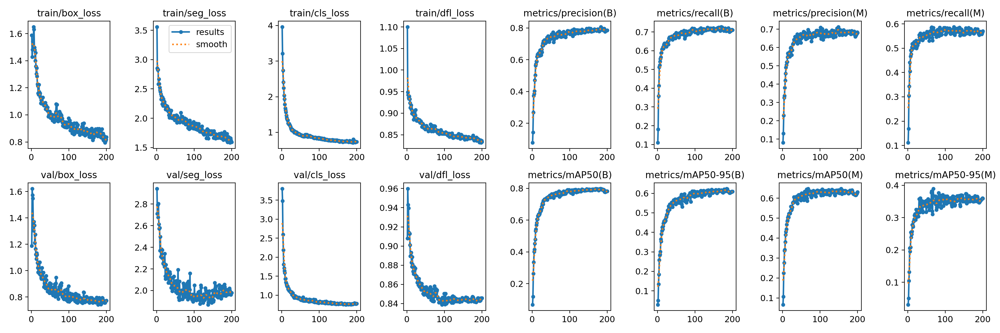

In [2]:
Image("./YOLOV8-data/results/200_epochs_GPU-/results.png")

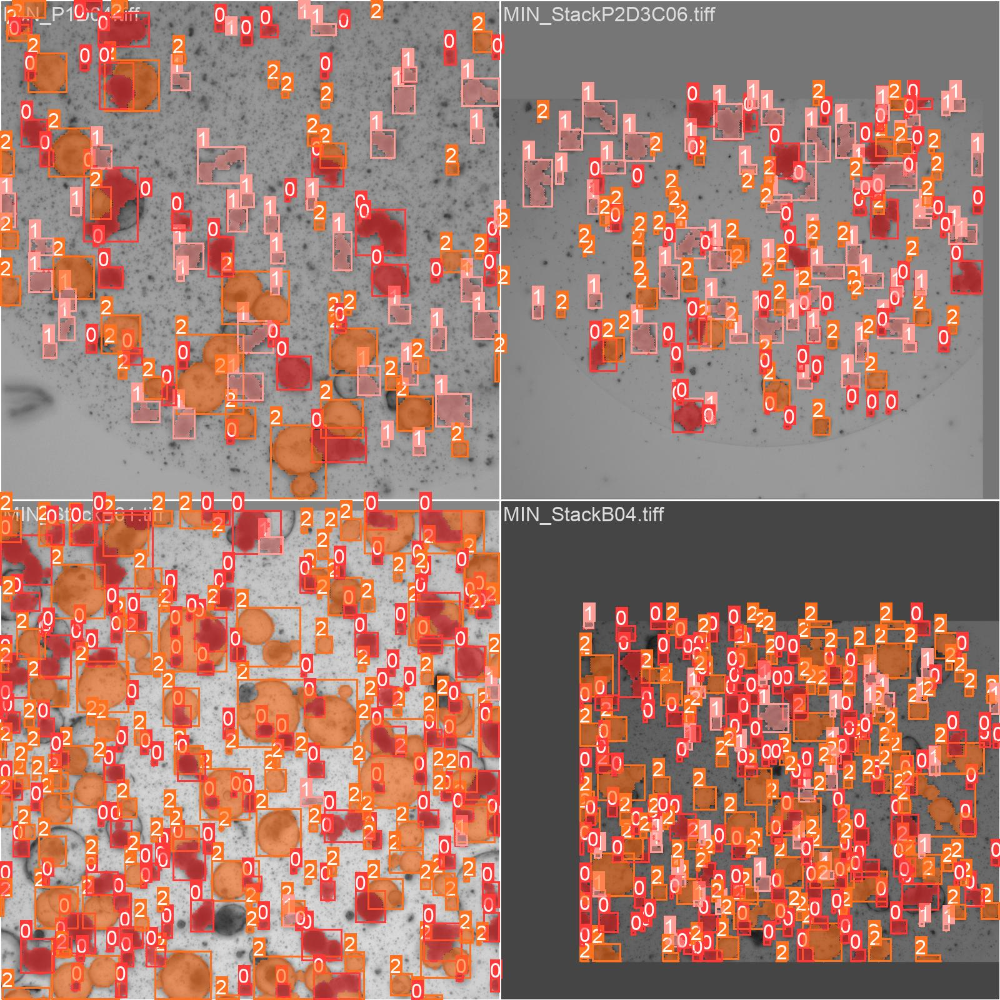

In [7]:
Image(filename="./YOLOV8-data/results/200_epochs_GPU-/train_batch4562.jpg", width=900)

**Run inference**

Now that our model is trained, we can use it for inference.

You can load the best model or the latest. I am picking the latest.

In [4]:
my_new_model = YOLO("./YOLOV8-data/results/200_epochs_GPU-/weights/last.pt")

Load an image and perform inference (segmentation).


image 1/1 c:\Users\albertds\Python_scripts\bf_intorg_YOLOv8_dev\datasets\datasets\yolo_dataset\valid\images\MIN_P1A01.tiff: 640x800 11 deads, 68 differentiateds, 19 undifferentiateds, 199.5ms
Speed: 6.1ms preprocess, 199.5ms inference, 114.2ms postprocess per image at shape (1, 3, 640, 800)


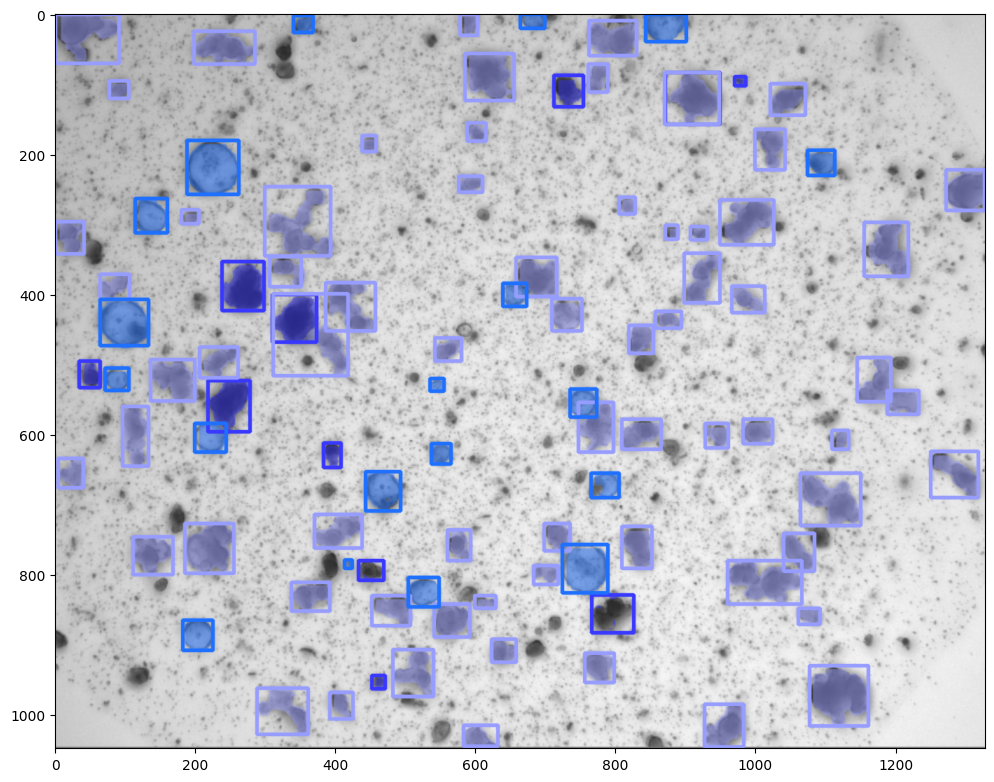

In [11]:
new_image = 'datasets/datasets/yolo_dataset/valid/images/MIN_P1A01.tiff'
new_results = my_new_model.predict(new_image, conf=0.6)  #Adjust conf threshold

new_result_array = new_results[0].plot(conf=False, labels=False)
plt.figure(figsize=(12, 12))
plt.imshow(new_result_array)


In [93]:
for result in new_results:
    boxes = result.boxes  # Boxes object for bbox outputs
    masks = result.masks  # Masks object for segmentation masks outputs
    probs = result.probs  # Class probabilities for classification outputs

The results are stored in a variable 'new_results'. Since we only have one image for segmentation, we will only have one set of results. Therefore, let us work with that one result.
https://docs.ultralytics.com/modes/predict/#plotting-results

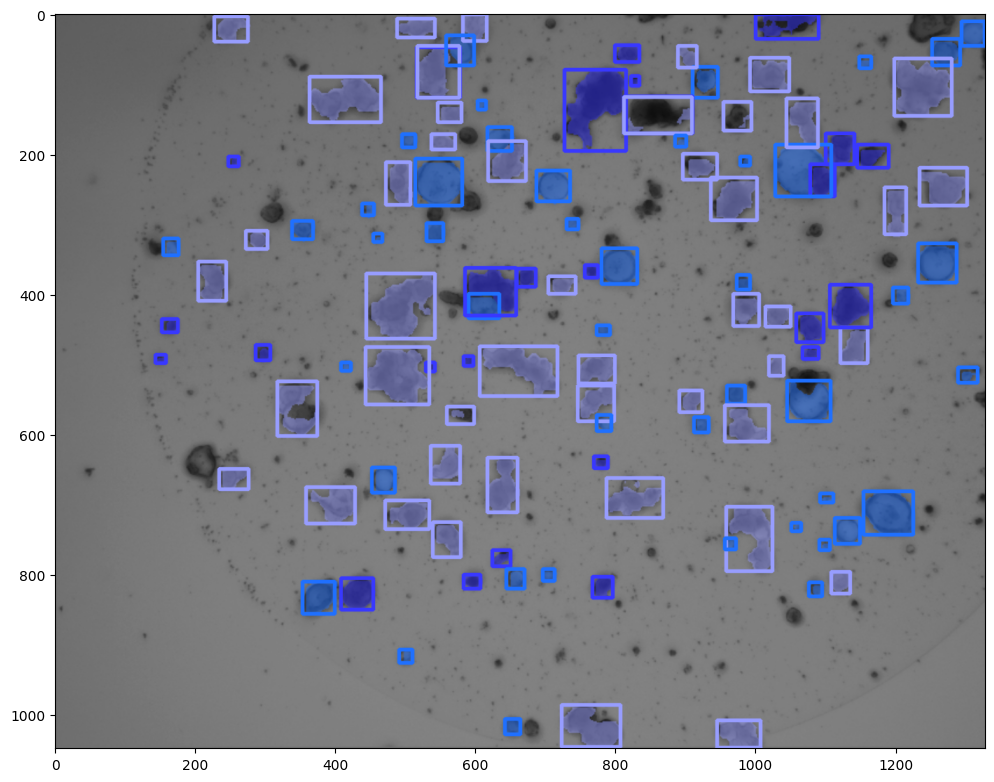

In [9]:
new_result_array = new_results[0].plot(conf=False, labels=False)
plt.figure(figsize=(12, 12))
plt.imshow(new_result_array)

**Extracting bounding boxes and segmented masks from the result**

In [95]:
new_result = new_results[0]

In [96]:
new_result

ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'dead', 1: 'differentiated', 2: 'undifferentiated'}
obb: None
orig_img: array([[[ 94,  94,  94],
        [ 94,  94,  94],
        [ 91,  91,  91],
        ...,
        [101, 101, 101],
        [105, 105, 105],
        [103, 103, 103]],

       [[ 92,  92,  92],
        [ 92,  92,  92],
        [ 91,  91,  91],
        ...,
        [101, 101, 101],
        [104, 104, 104],
        [104, 104, 104]],

       [[ 92,  92,  92],
        [ 92,  92,  92],
        [ 93,  93,  93],
        ...,
        [101, 101, 101],
        [102, 102, 102],
        [101, 101, 101]],

       ...,

       [[111, 111, 111],
        [110, 110, 110],
        [110, 110, 110],
        ...,
        [119, 119, 119],
        [120, 120, 120],
        [117, 117, 117]],

       [[109, 109, 109],
        [110, 110, 110],
        [107, 107, 107],

**Extracting bounding polygons** <p>
Use 'Masks.xyn' for segments (normalized) and 'Masks.xy' for segments (pixels)

In [22]:
pixels = new_result.masks.xyn

**Extracting segmented masks**

In [97]:
extracted_masks = new_result.masks.data

In [98]:
extracted_masks.shape

torch.Size([116, 640, 800])

Push the mask to cpu (from GPU) and convert to numpy array for easy plotting.

In [99]:
masks_array = extracted_masks.cpu().numpy()

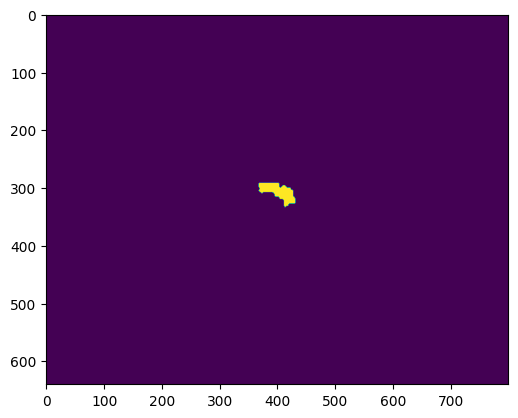

In [100]:
plt.imshow(masks_array[4])

**Extracting labels for each class**

In [101]:
class_names = new_result.names.values()
class_names

dict_values(['dead', 'differentiated', 'undifferentiated'])

In [102]:
# Extract the boxes, which likely contain class IDs
detected_boxes = new_result.boxes.data
# Extract class IDs from the detected boxes
class_labels = detected_boxes[:, -1].int().tolist()
# Initialize a dictionary to hold masks by class
masks_by_class = {name: [] for name in new_result.names.values()}

# Iterate through the masks and class labels
for mask, class_id in zip(extracted_masks, class_labels):
    class_name = new_result.names[class_id]  # Map class ID to class name
    masks_by_class[class_name].append(mask.cpu().numpy())

In [103]:
for class_name, masks in masks_by_class.items():
    print(f"Class Name: {class_name}, Number of Masks: {len(masks)}")


Class Name: dead, Number of Masks: 26
Class Name: differentiated, Number of Masks: 46
Class Name: undifferentiated, Number of Masks: 44


**Extracting masks for a specific class**

In [104]:
differentiated_masks = masks_by_class['differentiated']
spheroid_masks = masks_by_class['undifferentiated']

In [105]:
# Extract the original image
orig_img = new_result.orig_img

In [106]:
orig_img.shape

(1048, 1328, 3)

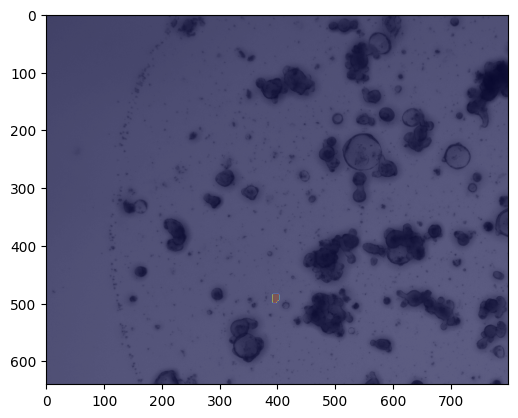

In [116]:
# Display the original image
plt.imshow(orig_img, cmap='gray')

# Overlay the mask with some transparency
#plt.imshow(alpha_granule_masks[1], cmap='jet', alpha=0.3)
plt.imshow(spheroid_masks[3], cmap='jet', alpha=0.3)
#plt.axis('off') # Turn off axis labels
plt.show()

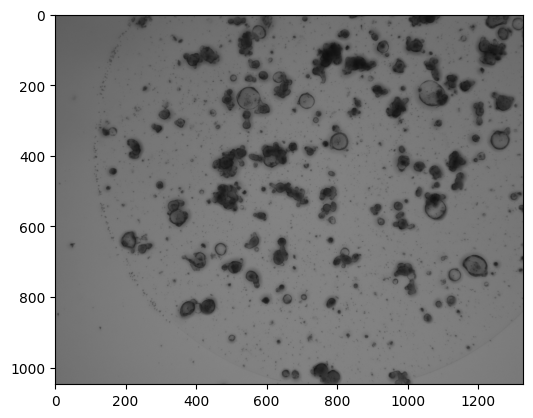

In [112]:
plt.imshow(orig_img, cmap='gray')

**Calculating region properties for all objects and saving to a csv file.**

In [ ]:
import pandas as pd
from skimage.measure import regionprops

# Initialize a list to store the properties
props_list = []

# Iterate through all classes
for class_name, masks in masks_by_class.items():
    # Iterate through the masks for this class
    for mask in masks:
        # Convert the mask to an integer type if it's not already
        mask = mask.astype(int)

        # Apply regionprops to the mask
        props = regionprops(mask)

        # Extract the properties you want (e.g., area, perimeter) and add them to the list
        for prop in props:
            area = prop.area
            perimeter = prop.perimeter
            # Add other properties as needed

            # Append the properties and class name to the list
            props_list.append({'Class Name': class_name, 'Area': area, 'Perimeter': perimeter})

# Convert the list of dictionaries to a DataFrame
props_df = pd.DataFrame(props_list)

# Now props_df contains the properties and class names for all regions

# Save the DataFrame to a CSV file
props_df.to_csv('/content/drive/MyDrive/ColabNotebooks/data/3D-EM-Platelet/YOLOv8_object_properties.csv', index=False)

In [ ]:
props_df

**Plotting results**

In [ ]:
import seaborn as sns


**Swarm plot**

In [ ]:

# Create the swarm plot with Seaborn
sns.swarmplot(x='Class Name', y='Area', data=props_df)

# Add labels and a title
plt.xlabel('Class Name')
plt.ylabel('Area')
plt.title('Area of Objects for Each Class')

# Rotate the x-axis labels for better visibility if needed
plt.xticks(rotation=45)

# Show the plot
plt.show()

**Box Plot**

In [ ]:
sns.boxplot(x='Class Name', y='Area', data=props_df)
# Add labels and a title
plt.xlabel('Class Name')
plt.ylabel('Area')
plt.title('Area of Objects for Each Class')

# Rotate the x-axis labels for better visibility if needed
plt.xticks(rotation=45)

# Show the plot
plt.show()

**Export model to ONNX for deployment.**

In [ ]:
# Export the model
my_new_model.export(format='onnx', imgsz=[800,800])
